In [1]:
import numpy as np
import pandas as pd

from dataprep.eda import *
# import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import re

## Description des variable

* ETF : ETF (Exchange Traded Fund ) ou FNB (fonds négocié en bourse) en français est un type de titre qui suit un indice , un secteur, une marchandise ou un autre actif, mais qui peut être acheté ou vendu en bourse de la même manière qu'une action ordinaire.<br><br>
* Date : La date du jour.<br><br>
* Open : Prix du ETF de l'or a l'ouverture du marché.<br><br>
* High : Prix du ETF de l'or le plus haut de la journée.<br><br>
* Low : Prix du ETF de l'or le plus bas de la journée.<br><br>
* Close : Prix du ETF de l'or à la Clôture  du marché.<br><br>
* Adj Close : Prix adjuté du ETF de l'or à la clôture du marché.<br><br>
* Volume : quantité de ETF de l'or disponible pour le jour.<br><br>
* Indice S&P 500 ou SP : Le S&P 500 est un indice boursier basé sur 500 grandes sociétés      cotées sur les bourses aux États-Unis (NYSE ou NASDAQ). L'indice est possédé et géré par Standard & Poor's, l'une des trois principales sociétés de notation financière.<br><br>
* Indice Dow Jones ou DJ : Le Dow Jones Industrial Average (abrégé en DJIA et souvent raccourci en Dow Jones) est le plus vieil indice des bourses de New York et le plus vieil indice boursier du monde.<br><br>
* Eldorado Gold Corporation (EGO) ou EG : Eldorado Gold Corp est un producteur d'or et de métaux de base basé au Canada avec des opérations d'extraction<br><br>
* EU : Taux de change EURO - USD<br><br>
* OF : Contrats à terme sur le pétrole brut Brent.<br><br>
* OS : Prix du Pétrole brut en USD<br><br>
* SF : Contrats à terme sur l'argent.<br><br>
* USB : Taux des obligations américaines (10 ans).<br><br>
* PLT : Prix du platine.<br><br>
* PLD_trend : Prix du palladium.<br><br>
* RHO_trend : Prix du Rhodium<br><br>
* USDI : Indice du dollar américain.<br><br>
* GDX : ETF des mineurs d'or.<br><br>
* USO : Pétrole ETF.<br><br>

**Variable à predire**
* Adjusted Close

In [2]:
data = pd.read_csv("FINAL_USO.csv", na_values=['null'],index_col='Date',parse_dates=True,infer_datetime_format=True)
# data = pd.read_csv("FINAL_USO.csv", na_values=['null'])

In [3]:
df = data.copy()
df.head()

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,123.029999,123.199997,121.989998,122.180000,...,51.570000,51.680000,48.973877,20605600,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,122.230003,122.949997,121.300003,121.589996,...,52.040001,52.680000,49.921513,16285400,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,122.059998,122.320000,120.029999,120.290001,...,51.029999,51.169998,48.490578,15120200,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,122.180000,124.139999,120.370003,123.930000,...,52.369999,52.990002,50.215282,11644900,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,123.930000,124.360001,122.750000,124.169998,...,52.419998,52.959999,50.186852,8724300,37.669998,38.240002,37.520000,38.110001,38.110001,10728000


In [4]:
df.shape

(1718, 80)

In [5]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
count,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,...,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03
mean,127.323434,127.854237,126.777695,127.319482,127.319482,8.446327e+06,204.490023,205.372637,203.487014,204.491222,...,26.384575,26.715012,25.924624,4.356515e+07,22.113417,22.307148,21.904657,22.109051,22.109051,1.922313e+07
std,17.526993,17.631189,17.396513,17.536269,17.536269,4.920731e+06,43.831928,43.974644,43.618940,43.776999,...,10.490908,10.603110,9.886570,2.909151e+07,11.431056,11.478671,11.373997,11.432787,11.432787,1.575743e+07
min,100.919998,100.989998,100.230003,100.500000,100.500000,1.501600e+06,122.059998,122.320000,120.029999,120.290001,...,12.400000,12.470000,12.269618,4.729000e+06,7.820000,8.030000,7.670000,7.960000,7.960000,1.035100e+06
25%,116.220001,116.540001,115.739998,116.052502,116.052502,5.412925e+06,170.392498,170.962506,169.577499,170.397500,...,20.355000,20.585000,20.180950,2.259968e+07,11.420000,11.500000,11.300000,11.392500,11.392500,6.229500e+06
50%,121.915001,122.325001,121.369999,121.795002,121.795002,7.483900e+06,205.464996,206.459999,204.430000,205.529999,...,22.870001,23.054999,22.677604,3.730465e+07,16.450000,16.635001,16.040000,16.345000,16.345000,1.613015e+07
75%,128.427494,129.087498,127.840001,128.470001,128.470001,1.020795e+07,237.292500,237.722500,236.147503,236.889996,...,26.797500,27.317500,26.478154,5.697055e+07,34.419998,34.667499,34.110000,34.417499,34.417499,2.672375e+07
max,173.199997,174.070007,172.919998,173.610001,173.610001,9.380420e+07,293.089996,293.940002,291.809998,293.579987,...,56.770000,57.470001,54.617039,2.321536e+08,41.599998,42.299999,41.299999,42.009998,42.009998,1.102657e+08


In [6]:
val_aj_close = ["Adj Close", "SP_Ajclose", "DJ_Ajclose", "EG_Ajclose", "GDX_Adj Close", "USO_Adj Close"]

In [7]:
# df.info()

  0%|                                                                                        | 0/25007 [00:00<…


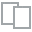
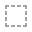
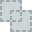
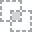
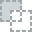
...
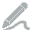
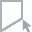
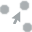
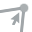
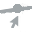

In [8]:
create_report(df).show()

In [9]:
fig = px.line(df, x=df.index, y="Adj Close", title="Evolution du prix de l'OR par ans")
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

In [10]:
df_c = df[val_aj_close]

In [11]:
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_c.columns),
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[df_c[k].tolist() for k in df_c.columns[:]],
               fill_color='lavender',
               align='left'))
])

fig.show()

In [12]:
fig = px.line(df_c, x=df_c.index, y=df_c.columns,
              title='Evolution du Prix des Métaux par ans')
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

In [20]:
fig = px.line(df_c.loc['2012'], x=df_c.loc['2012'].index, y=df_c.loc['2012'].columns,
              title='Evolution du Prix des Métaux par anen 2012')
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y",
    ticklabelmode="period")
fig.show()

In [14]:
df12 = df_c.loc['2012']
df13 = df_c.loc['2013']
df14 = df_c.loc['2014']
df15 = df_c.loc['2015']
df16 = df_c.loc['2016']
df17 = df_c.loc['2017']
df18 = df_c.loc['2018']

In [15]:
fig = make_subplots(
    rows=2, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.03,
    specs=[[{"type": "scatter"}],
           [{"type": "scatter"}]]
)

fig.add_trace(
    go.Scatter(
        x=df12.index,
        y=df12["Adj Close"],
        mode="lines",
        name="mining revenue"
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(
        x=df12.index,
        y=df13["Adj Close"],
        mode="lines",
        name="hash-rate-TH/s"
    ),
    row=2, col=1
)


fig.update_layout(
    height=800,
    showlegend=False,
    title_text="Bitcoin mining stats for 180 days",
)

fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y",
    ticklabelmode="period")

fig.show()


In [16]:
fig = px.line(df, x=df.index, y=df.columns[:6],
              title='Evolution du Prix des Métaux par ans')
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=12, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    ),
    dtick="M1",
    tickformat="%b\n%Y",
    ticklabelmode="period"
)
fig.show()

In [17]:
df.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SP_open',
       'SP_high', 'SP_low', 'SP_close', 'SP_Ajclose', 'SP_volume', 'DJ_open',
       'DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume', 'EG_open',
       'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume', 'EU_Price',
       'EU_open', 'EU_high', 'EU_low', 'EU_Trend', 'OF_Price', 'OF_Open',
       'OF_High', 'OF_Low', 'OF_Volume', 'OF_Trend', 'OS_Price', 'OS_Open',
       'OS_High', 'OS_Low', 'OS_Trend', 'SF_Price', 'SF_Open', 'SF_High',
       'SF_Low', 'SF_Volume', 'SF_Trend', 'USB_Price', 'USB_Open', 'USB_High',
       'USB_Low', 'USB_Trend', 'PLT_Price', 'PLT_Open', 'PLT_High', 'PLT_Low',
       'PLT_Trend', 'PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low',
       'PLD_Trend', 'RHO_PRICE', 'USDI_Price', 'USDI_Open', 'USDI_High',
       'USDI_Low', 'USDI_Volume', 'USDI_Trend', 'GDX_Open', 'GDX_High',
       'GDX_Low', 'GDX_Close', 'GDX_Adj Close', 'GDX_Volume', 'USO_Open',
       'USO_High', 'USO

In [18]:
# from statsmodels.tsa.seasonal import seasonal_decompose
# import matplotlib.pyplot as plt

# decomp_x = seasonal_decompose(df['Adj Close'],  model='multiplicative', period=1)
# plt.rcParams.update({'figure.figsize': (13,6)})
# decomp_x.plot().suptitle('Composante de la Série', fontsize=22)
# plt.show()